
# Fitness Project: Speed Kills


## Purpose
I am trying to discover insights about my workout performance.

In [2]:
import plotly.express as px
import numpy as np
import scipy as sp
import plotly.graph_objects as go
import pandas as pd
df=pd.read_csv("strava.csv")

In [3]:
df.head(10)

,Air Power,Cadence,Form Power,Ground Time,Leg Spring Stiffness,Power,Vertical Oscillation,altitude,cadence,datafile,...,enhanced_speed,fractional_cadence,heart_rate,position_lat,position_long,speed,timestamp,unknown_87,unknown_88,unknown_90
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,activities/2675855419.fit.gz,...,0.000,0.0,68.0,NaN,NaN,0.0,2019-07-08 21:04:03,0.0,300.0,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,activities/2675855419.fit.gz,...,0.000,0.0,68.0,NaN,NaN,0.0,2019-07-08 21:04:04,0.0,300.0,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,54.0,activities/2675855419.fit.gz,...,1.316,0.0,71.0,NaN,NaN,1316.0,2019-07-08 21:04:07,0.0,300.0,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3747.0,77.0,activities/2675855419.fit.gz,...,1.866,0.0,77.0,504432050.0,-999063637.0,1866.0,2019-07-08 21:04:14,0.0,100.0,NaN
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3798.0,77.0,activities/2675855419.fit.gz,...,1.894,0.0,80.0,504432492.0,-999064534.0,1894.0,2019-07-08 21:04:15,0.0,100.0,NaN
5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3799.0,77.0,activities/2675855419.fit.gz,...,1.894,0.0,83.0,504432667.0,-999064622.0,1894.0,2019-07-08 21:04:16,0.0,100.0,NaN
6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3802.0,77.0,activities/2675855419.fit.gz,...,1.903,0.0,83.0,504432736.0,-999064796.0,1903.0,2019-07-08 21:04:17,0.0,300.0,NaN
7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3811.0,77.0,activities/2675855419.fit.gz,...,1.997,0.0,86.0,504432914.0,-999064984.0,1997.0,2019-07-08 21:04:18,0.0,300.0,NaN
8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3826.0,74.0,activities/2675855419.fit.gz,...,2.025,0.5,90.0,504433069.0,-999065633.0,2025.0,2019-07-08 21:04:20,0.0,300.0,NaN
9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3829.0,74.0,activities/2675855419.fit.gz,...,2.006,0.5,92.0,504433278.0,-999066439.0,2006.0,2019-07-08 21:04:22,0.0,300.0,NaN


After opening the file, I decided to explore some of the basic inofrmation regarding all of the metrics to get a general sense of their distributions, range etc.

In [4]:
print(df.describe())


          Air Power       Cadence    Form Power   Ground Time  \
count  17842.000000  17847.000000  17842.000000  17847.000000   
mean       1.872100     77.726565     99.485932    325.934107   
std        2.777476      9.202077     13.866222     71.773687   
min        0.000000      0.000000      0.000000      0.000000   
25%        1.000000     78.000000     97.000000    308.000000   
50%        1.000000     79.000000    101.000000    326.000000   
75%        2.000000     80.000000    105.000000    340.000000   
max       48.000000     88.000000    125.000000   1732.000000   

       Leg Spring Stiffness         Power  Vertical Oscillation      altitude  \
count          17842.000000  17847.000000          17847.000000  14905.000000   
mean              13.138571    301.459797              6.458074   3846.184368   
std                2.039567     48.540552              1.135497    134.262498   
min                0.000000      0.000000              0.000000   3555.000000   
25%      

I decided to use the metrics: heart_rate, distance,cadence,altitude,power.

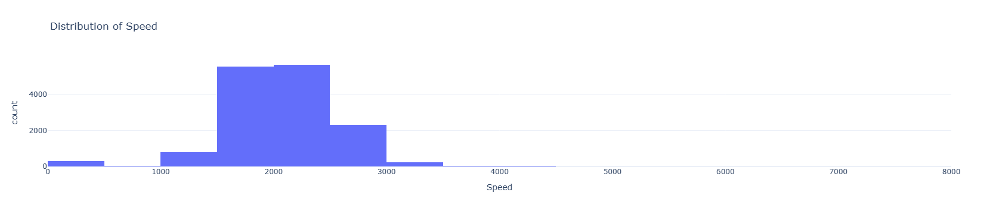

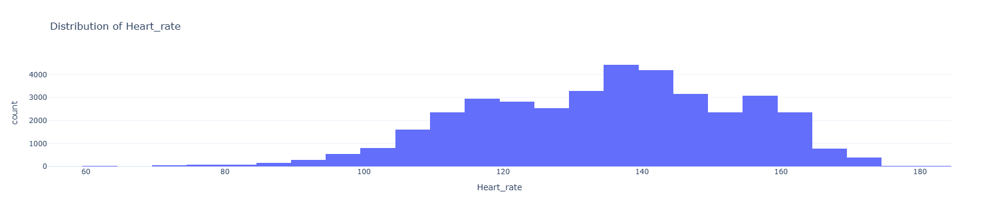

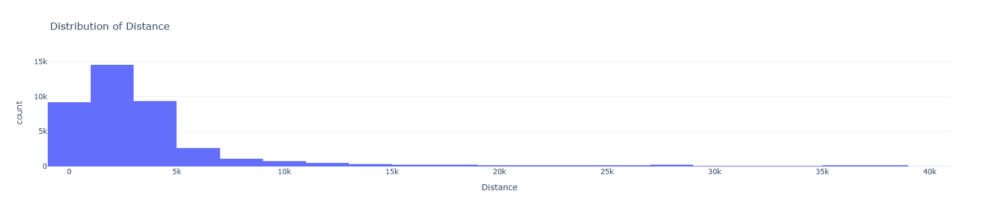

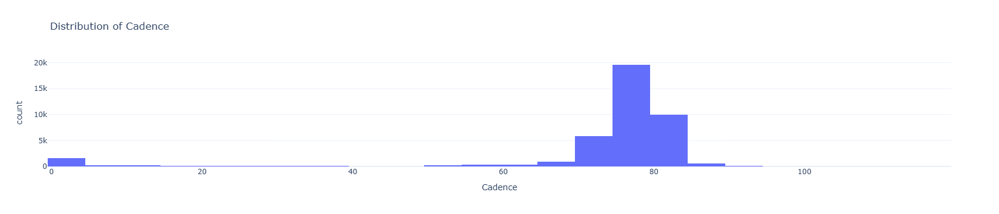

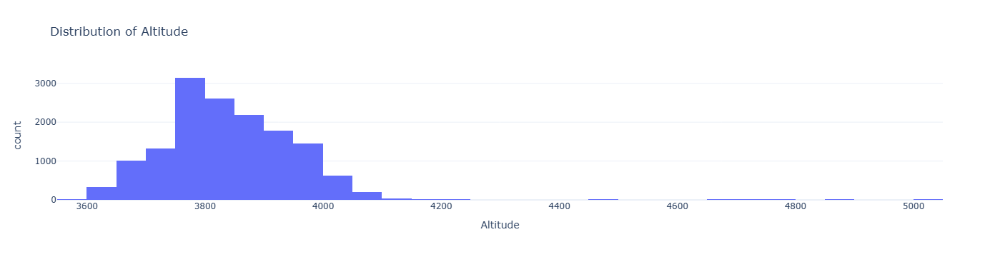

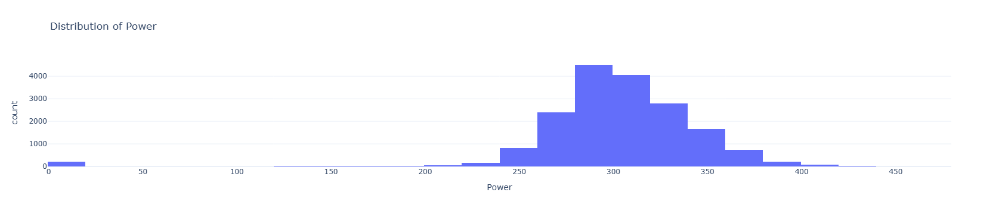

In [4]:

columns_to_plot = ['speed', 'heart_rate', 'distance','cadence','altitude','Power']



for col in columns_to_plot:
    if col in df.columns: 
        filtered_df = df[df[col].notna()] 
        fig = px.histogram(
            filtered_df, 
            x=col, 
            nbins=30, 
            title=f"Distribution of {col.capitalize()}", 
            labels={col: col.capitalize()}, 
            template="plotly_white"
        )
        fig.show()
    else:
        print(f"Column {col} not found in the dataset.")


Histograms provide a detailed view of the frequency distribution of the data, allowing us to understand the overall spread of each variable.

Heart Rate: The histogram of heart rate confirms the presence of a central peak with a slight skew towards higher values. This suggests that while the majority of activities were done at moderate to low intensity, a number of observations have higher heart rates, potentially due to more strenuous activities.

Speed: The histogram for speed shows a rightward skew, which is consistent with what we saw in the box and violin plots. This further emphasizes that while most of the sessions were at lower speeds, there were a few sessions with much higher speeds that contribute to the skewness.

Cadence and Power: Both cadence and power histograms show roughly normal distributions, though cadence appears slightly skewed to the right. The power distribution is fairly symmetric, suggesting that most of the activity was at a moderate power output level, with fewer occurrences of very high or very low power.

Altitude: The altitude histogram shows a concentration of data around lower altitudes, with fewer data points at higher altitudes, which may reflect the nature of the exercise routes chosen.

Distance: The distance histogram shows a concentration fo data around lower distances and is skewed further to the left, suggesting that the distance of the majority of workouts was relatively low.

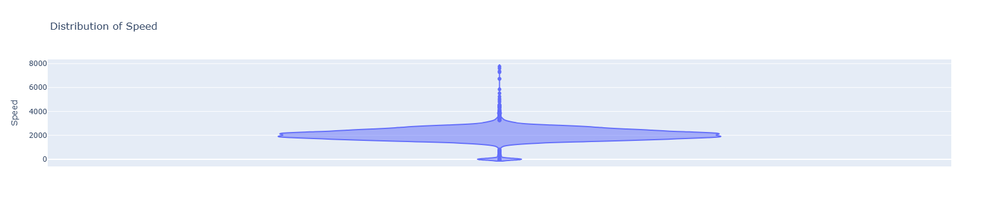

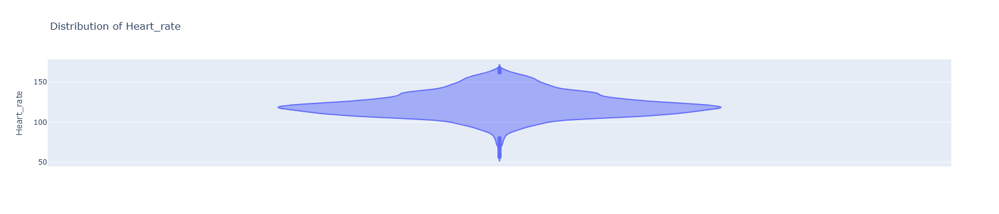

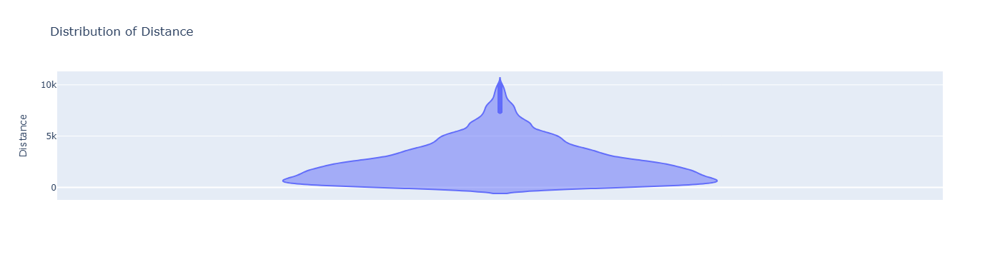

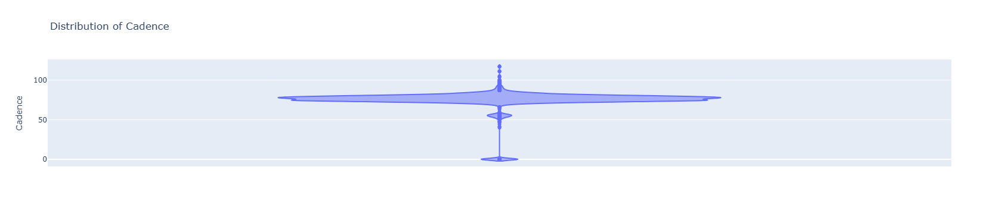

In [49]:
#violin plot
columns_to_plot = ['speed', 'heart_rate', 'distance', 'cadence','power']
for col in columns_to_plot:
    if col in df.columns:  
        fig_box = px.violin(df, y=col, title=f"Distribution of {col.capitalize()}", labels={col: col.capitalize()})
        fig_box.show()
    else:
        print(f"Column {col} not found in the dataset.")


The plots provide useful insights into the distributions of key variables, they do not reveal particularly surprising or extreme patterns that would warrant further exploration. The slight skewness observed in some variables like speed and heart rate suggests that while the majority of activities are moderate in intensity, there are a few extreme cases where performance or exertion is much higher. These distributional plots, though useful for understanding the overall spread of the data, do not provide breakthrough insights but serve to confirm general expectations regarding exercise variability.

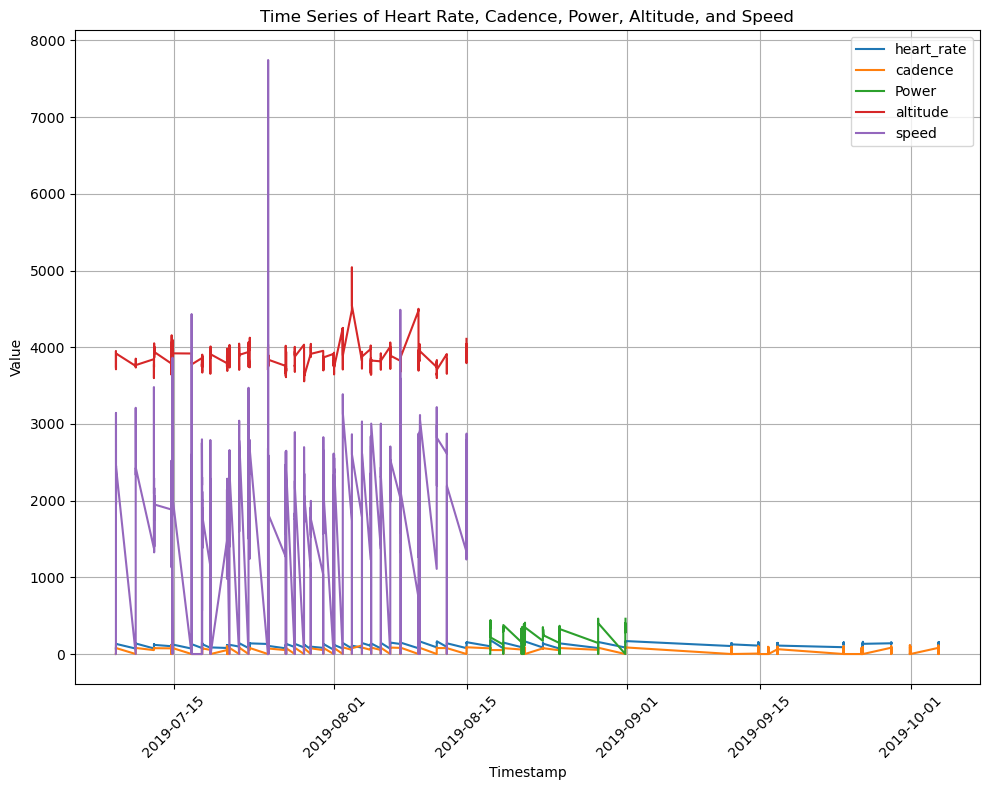

In [69]:
#line plots
import matplotlib.pyplot as plt




columns_to_plot = ['heart_rate', 'cadence', 'Power', 'altitude', 'speed']

plt.figure(figsize=(10, 8))

for col in columns_to_plot:
    plt.plot(df['timestamp'], df[col], label=col)

plt.title("Time Series of Heart Rate, Cadence, Power, Altitude, and Speed")
plt.xlabel("Timestamp")
plt.ylabel("Value")
plt.legend()
plt.grid(True)

plt.xticks(rotation=45)
plt.tight_layout()
plt.show()



Insights from the Time Series Plot
This time series line plot depicts the variation in heart rate, cadence, power, altitude, and speed over time. Below are the observations and how they connect with the violin plots, histograms, and OLS regression results below:

Trends and Variability in Variables:
Heart Rate: Heart rate values remain relatively stable over time, aligning with the central concentration observed in the box and violin plots. This consistency suggests that most activities were performed at a moderate intensity.

Cadence: Cadence shows a similar stable trend with minor fluctuations, reinforcing its relatively symmetric distribution in the violin and histogram plots. The OLS regression indicates cadence has the highest positive impact on speed, highlighting its importance in performance optimization.

Power: Power values display sporadic spikes but generally stay within a narrow range. This variability matches its distribution, which is relatively symmetric in the histogram and violin plots. The regression analysis suggests power contributes positively to speed but less significantly compared to cadence.
Altitude: Altitude fluctuates over a broad range, with a few peaks. This aligns with the clustering of data at lower altitudes in the histogram, indicating that most sessions occur in flatter terrains with occasional climbs. The OLS regression confirms altitude's minor but positive influence on speed.

Speed: Speed shows large spikes at several points, consistent with its right-skewed distribution in the histogram. The spikes represent high-intensity or fast-paced sessions. The regression identifies speed as influenced by all the independent variables, with cadence and heart rate being the most significant contributors.

 Anomalies and Outliers:
The sharp spikes in power, speed, and altitude highlight the presence of outliers, which correspond to high-intensity activities or significant terrain changes. These outliers are also reflected in the box plots and the right-skewed distributions of these variables.

Regression Analysis and Time Dependency:
The OLS regression suggests that time itself (captured by time_index) is positively associated with speed, albeit with a small coefficient. This indicates gradual improvements in performance metrics over time, potentially due to increased fitness or familiarity with the exercise routines.

This plot provides context to the distributions and regression insights. It shows that the relationships observed in the OLS regression are consistent across the dataset. For instance, stable cadence and heart rate correspond to steady performance, while fluctuations in power and altitude correlate with speed spikes.

The combination of this time series plot with the violin plots, histograms, and regression analysis provides a comprehensive view of the data, highlighting both overall trends and occasional deviations. Together, they reveal how the variables interact to influence performance, with cadence and heart rate emerging as the most critical factors for maintaining or improving speed.
This analysis underscores the importance of focusing on cadence and heart rate for consistent performance improvement, while managing power output and altitude changes during high-intensity activities.

In [43]:
import pandas as pd
import statsmodels.api as sm

# Load data
df = pd.read_csv("strava.csv")

# Ensure timestamp is datetime type and sort the data
df['timestamp'] = pd.to_datetime(df['timestamp'])
df = df.sort_values('timestamp')

df['time_index'] = (df['timestamp'] - df['timestamp'].min()).dt.total_seconds()


df = df.dropna(subset=['speed', 'heart_rate', 'distance', 'time_index','altitude','cadence'])


X = df[['time_index', 'heart_rate', 'distance','cadence','altitude']]  
X = sm.add_constant(X)  
y = df['speed'] 


model = sm.OLS(y, X).fit()


print(model.summary())


                            OLS Regression Results                            
Dep. Variable:                  speed   R-squared:                       0.488
Model:                            OLS   Adj. R-squared:                  0.488
Method:                 Least Squares   F-statistic:                     2836.
Date:                Sun, 17 Nov 2024   Prob (F-statistic):               0.00
Time:                        02:37:32   Log-Likelihood:            -1.0948e+05
No. Observations:               14901   AIC:                         2.190e+05
Df Residuals:                   14895   BIC:                         2.190e+05
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const      -1265.4176     98.150    -12.893      0.0

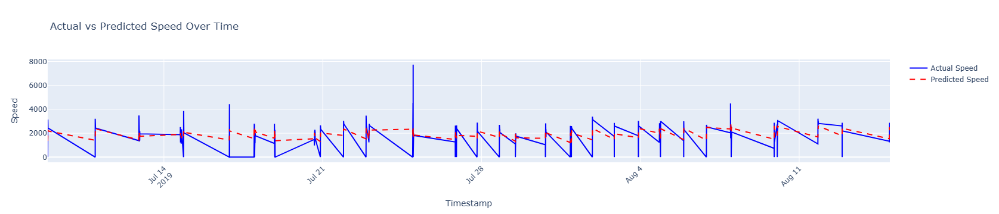

In [1]:
import pandas as pd
import statsmodels.api as sm

import plotly.graph_objects as go


df = pd.read_csv("strava.csv")


df['timestamp'] = pd.to_datetime(df['timestamp'])
df = df.sort_values('timestamp')


df['time_index'] = (df['timestamp'] - df['timestamp'].min()).dt.total_seconds()


df = df.dropna(subset=['speed', 'heart_rate', 'distance', 'time_index'])

X = df[['time_index', 'heart_rate', 'distance']]  
X = sm.add_constant(X)  
y = df['speed']  

model = sm.OLS(y, X).fit()

df['predicted_speed'] = model.predict(X)



fig = go.Figure()

fig.add_trace(go.Scatter(x=df['timestamp'], y=df['speed'], mode='lines', name='Actual Speed', line=dict(color='blue', width=2)))


fig.add_trace(go.Scatter(x=df['timestamp'], y=df['predicted_speed'], mode='lines', name='Predicted Speed', line=dict(color='red', dash='dash', width=2)))


fig.update_layout(
    title="Actual vs Predicted Speed Over Time",
    xaxis_title="Timestamp",
    yaxis_title="Speed",
    xaxis_tickangle=-45
)

fig.show()


My exercise data provides an insightful view into how different factors, such as heart rate, distance, cadence, and altitude, relate to his exercise performance over time. Using ordinary least squares (OLS) regression, we were able to quantify the relationship between various predictors and the dependent variable, speed.

Key Insights:
Impact of Time (time_index): The coefficient for time_index (4.689e-05) indicates a significant positive relationship between time and speed. This suggests that as time progresses, Professor Brooks’ speed is gradually increasing, albeit by a small amount per time step. The coefficient is statistically significant (p-value = 0.000), which highlights the importance of time in predicting speed.

Heart Rate's Influence: Heart rate has a positive and strong influence on speed (coefficient = 8.789). This indicates that, all else being equal, as Professor Brooks’ heart rate increases, his speed tends to increase as well. Given that heart rate is closely linked to exercise intensity, this result suggests that higher exertion levels lead to higher performance in terms of speed, which aligns with expectations in exercise physiology. The relationship is statistically significant with a p-value of 0.000.

Distance and Speed: Distance is negatively correlated with speed (coefficient = -0.0432), meaning that as the distance increases, speed decreases. This is likely due to the longer distances being associated with longer-duration activities, during which fatigue could slow down the speed. This result is significant with a p-value of 0.000, suggesting that distance is a crucial factor in determining speed.

Cadence's Positive Role: The coefficient for cadence (21.5432) is also positive, indicating that higher cadence (the rate of pedaling or stride frequency) is associated with an increase in speed. This suggests that maintaining a higher cadence is beneficial for increasing speed, which may reflect an efficient cycling or running technique. Cadence is statistically significant, with a very low p-value.

Altitude’s Effect: The coefficient for altitude is positive (0.1793), indicating that higher altitudes are associated with slightly higher speeds. This could be due to the fact that, in some cases, increased altitude leads to improved cardiovascular performance, but this effect might be subtle in the data. The result is statistically significant with a p-value of 0.000.

Multicollinearity Warning:
The regression results also show a large condition number (5.55e+07), which may suggest issues with multicollinearity. This occurs when some of the predictor variables are highly correlated with each other, making it harder to determine the individual impact of each variable. For instance, it’s possible that cadence and speed may be related due to their inherent link in exercise physiology, which could be causing multicollinearity. Multicollinearity can inflate the standard errors of the coefficients, leading to less reliable estimates.

Statistical Significance:
All the coefficients in the model (time_index, heart_rate, distance, cadence, and altitude) are statistically significant (p-value < 0.05). This means that each of these variables has a reliable and meaningful relationship with speed, making them valuable for predicting speed during exercise.

Further Considerations:
The Durbin-Watson statistic is 0.308, which is quite low. This suggests the possibility of autocorrelation in the residuals, meaning that the model's errors are correlated over time. This could indicate that the time series data is not independent, and further analysis may be needed to adjust for potential autocorrelation.

Conclusion:
Overall, the regression analysis reveals significant relationships between speed and several exercise variables, including heart rate, cadence, distance, and altitude. While time and intensity (heart rate) have a positive effect on speed, distance and other factors like cadence and altitude provide valuable insights into exercise dynamics. However, caution must be taken when interpreting these results, especially considering potential multicollinearity and autocorrelation issues in the model.


